# Predicting Patient Readmission Risk
This project aims to develop a model that can predict patient readmission risk based on patient data. Accurately identifying high-risk patients can help medical providers improve patient care and reduce costs associated with frequent readmissions.

## Project Outline
1. **Business Understanding**
2. **Data Understanding**
3. **Data Import and Library Setup**
4. **Data Cleaning**
5. **Exploratory Data Analysis (EDA)**
6.
7.
8.
9.
10.

## 1. BUSINESS UNDERSTANDING
Hospital readmission rates are a significant concern in healthcare management due to their impact on both patient well-being and hospital costs. Our goal is to identify key factors influencing readmission risk and build a predictive model that flags high-risk patients.

**Key Questions:**
- Which patient characteristics correlate with a higher readmission risk?
- How does the length of hospital stay impact readmission likelihood?
- Can we develop an actionable model to predict readmissions?

The dataset includes patient demographics, hospital visits, and medical metrics, allowing us to explore patterns associated with readmissions.

## 2. DATA UNDERSTANDING
The data used in this project contains patient information including demographics, hospital metrics, and readmission indicators. We will focus on the following columns:

- **patient_nbr**: Unique patient identifier.
- **gender**: Patient gender.
- **age**: Age group of the patient.
- **weight**: Patient weight (if recorded).
- **time_in_hospital**: Length of stay in days.
- **medical_specialty**: Primary care specialty.
- **num_lab_procedures**: Number of lab tests performed during the hospital stay.
- **num_procedures**: Number of procedures during the stay.
- **num_medications**: Number of medications administered.
- **number_outpatient**: Outpatient visits.
- **number_emergency**: Emergency visits.
- **number_inpatient**: Previous inpatient visits.
- **number_diagnoses**: Number of diagnoses.
- **diabetesMed**: Whether diabetes medication was prescribed.
- **readmitted**: Indicator if the patient was readmitted (target variable).

## 3. IMPORTING NECESSARY LIBRARIES

In [462]:
# Importing necessary libraries
import pandas as pd  # For data manipulation
import numpy as np   # For numerical operations
import seaborn as sns  # For visualizations
import matplotlib.pyplot as plt  # For plotting
from sklearn.model_selection import train_test_split  # For data splitting

# Display settings for data frames
pd.set_option('display.max_columns', None)  

In [463]:
# Load the data
file_path = 'synthetic_diabetic_data.csv'
data = pd.read_csv(file_path)

# Display the first 5 rows
data.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,429727004,161137462,Other,Female,[70-80),[125-150),5,10,25,5,OT,InfectiousDiseases,66,2,9,33,71,18,506,11,824,1,>200,None,Down,No,Steady,Down,No,No,No,No,No,Down,Steady,Down,Up,Steady,No,No,No,No,No,Steady,Steady,Steady,No,Ch,No,>30
4,24882254,178987224,Other,Male,[60-70),[50-75),2,25,18,12,BC,DCPTEAM,83,0,54,37,14,1,980,555,500,6,Norm,Norm,Up,Up,Steady,Steady,Down,No,Steady,No,No,No,No,No,No,No,Up,No,No,Steady,Up,No,No,No,Steady,No,Yes,>30


## 4. DATA CLEANING

### 1. Selecting necessary columns

In this section, we’ll identify and justify the columns to be dropped for our patient readmission prediction task. Some columns may not have a direct influence on the likelihood of readmission, such as those with demographic information that isn't strongly correlated with readmission.

Columns such as race and payer code do not affect a patient's risk of readmission and hence will not be used for this analysis.

In [464]:
# Select only the specified columns
columns_needed = [
    'patient_nbr', 'gender', 'age', 'weight', 'time_in_hospital', 
    'medical_specialty', 'num_lab_procedures', 'num_procedures', 
    'num_medications', 'number_outpatient', 'number_emergency', 
    'number_inpatient', 'number_diagnoses', 'diabetesMed', 'readmitted'
]
data = data[columns_needed]

### 2. Checking for missing velues

In [465]:
missing_values = data.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 patient_nbr           0
gender                0
age                   0
weight                0
time_in_hospital      0
medical_specialty     0
num_lab_procedures    0
num_procedures        0
num_medications       0
number_outpatient     0
number_emergency      0
number_inpatient      0
number_diagnoses      0
diabetesMed           0
readmitted            0
dtype: int64


### 3. Handling missing values

In [466]:
# Dropping rows where 'weight' is missing as a potential option
data.dropna(subset=['weight'], inplace=True)
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
0,8222157,Female,[0-10),?,1,Pediatrics-Endocrinology,41,0,1,0,0,0,1,No,NO
1,55629189,Female,[10-20),?,3,?,59,0,18,0,0,0,9,Yes,>30
2,86047875,Female,[20-30),?,2,?,11,5,13,2,0,1,6,Yes,NO
3,161137462,Female,[70-80),[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,[60-70),[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30


In [467]:
# Dropping rows with '?' in the column weight
data = data[(data['weight'] != '?')]

# Display the first few rows to confirm the changes
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,Female,[70-80),[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,[60-70),[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,Unknown/Invalid,[30-40),>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,Male,[30-40),[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,Female,[20-30),[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


In [468]:
# Dropping rows with '?' in the column medical_speciality
data = data[(data['medical_specialty'] != '?')]

# Display the first few rows to confirm the changes
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,Female,[70-80),[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,[60-70),[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,Unknown/Invalid,[30-40),>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,Male,[30-40),[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,Female,[20-30),[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


### 4. Removing duplicates

Checking for duplicates

In [469]:
# Checking for duplicates in each column
for column in data.columns:
    duplicates = data[column].duplicated().sum()
    print(f"Column '{column}' has {duplicates} duplicate values.")

Column 'patient_nbr' has 1 duplicate values.
Column 'gender' has 8851 duplicate values.
Column 'age' has 8844 duplicate values.
Column 'weight' has 8845 duplicate values.
Column 'time_in_hospital' has 8840 duplicate values.
Column 'medical_specialty' has 8782 duplicate values.
Column 'num_lab_procedures' has 8722 duplicate values.
Column 'num_procedures' has 8847 duplicate values.
Column 'num_medications' has 8773 duplicate values.
Column 'number_outpatient' has 8811 duplicate values.
Column 'number_emergency' has 8777 duplicate values.
Column 'number_inpatient' has 8832 duplicate values.
Column 'number_diagnoses' has 8838 duplicate values.
Column 'diabetesMed' has 8852 duplicate values.
Column 'readmitted' has 8851 duplicate values.


In [470]:
# Removing duplicates from the column 'patient_nbr'
data = data.drop_duplicates(subset=['patient_nbr'], keep='first')

In [471]:
# Checking for duplicates in each column to confirm the changes
for column in data.columns:
    duplicates = data[column].duplicated().sum()
    print(f"Column '{column}' has {duplicates} duplicate values.")

Column 'patient_nbr' has 0 duplicate values.
Column 'gender' has 8850 duplicate values.
Column 'age' has 8843 duplicate values.
Column 'weight' has 8844 duplicate values.
Column 'time_in_hospital' has 8839 duplicate values.
Column 'medical_specialty' has 8781 duplicate values.
Column 'num_lab_procedures' has 8721 duplicate values.
Column 'num_procedures' has 8846 duplicate values.
Column 'num_medications' has 8772 duplicate values.
Column 'number_outpatient' has 8810 duplicate values.
Column 'number_emergency' has 8776 duplicate values.
Column 'number_inpatient' has 8831 duplicate values.
Column 'number_diagnoses' has 8837 duplicate values.
Column 'diabetesMed' has 8851 duplicate values.
Column 'readmitted' has 8850 duplicate values.


## 5. EXPLORATORY DATA ANALYSIS (EDA)
In this section, we will explore the data to understand the distributions and relationships between variables. Visualizations will help identify patterns and outliers, as well as provide insights into factors associated with readmissions.


In [472]:
# Summary statistics
data.describe()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,8.853000e+03,8853.000000,8853.000000,8853.000000,8853.000000,8853.000000,8853.000000,8853.000000,8853.000000
mean,9.442742e+07,7.534508,66.791596,3.031402,41.333107,21.043375,38.245679,10.517678,8.580933
std,5.472411e+07,4.024309,37.995975,1.997379,23.277760,12.415959,22.254923,6.316213,4.568172
min,3.750500e+04,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,4.702353e+07,4.000000,34.000000,1.000000,21.000000,10.000000,19.000000,5.000000,5.000000
50%,9.449942e+07,8.000000,67.000000,3.000000,41.000000,21.000000,39.000000,11.000000,9.000000
75%,1.422599e+08,11.000000,99.000000,5.000000,61.000000,32.000000,58.000000,16.000000,13.000000
max,1.894782e+08,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


### Age Group Distribution
This plot shows the distribution of patients across different age groups. By visualizing the counts for each age group, we can identify the age ranges that are more prevalent in the dataset. This information is essential because age can be a factor in readmission risk. Knowing which age groups have the highest or lowest representation will guide our analysis, especially if age impacts readmission rates.

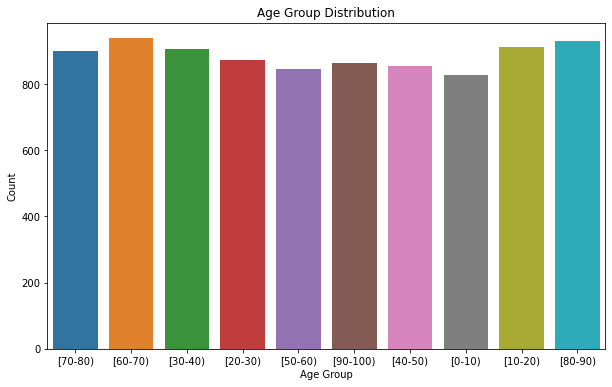

In [473]:
# Age distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='age')
plt.title('Age Group Distribution')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

### Readmission rates by age group
This plot uses the `age` column on the x-axis and the count of patients on the y-axis, with a separate bar for each `readmitted` status (e.g., `Yes` or `No`). By visualizing it this way, we can see which age groups are most frequently readmitted compared to those who aren’t, highlighting any age-related trends in readmission rates.

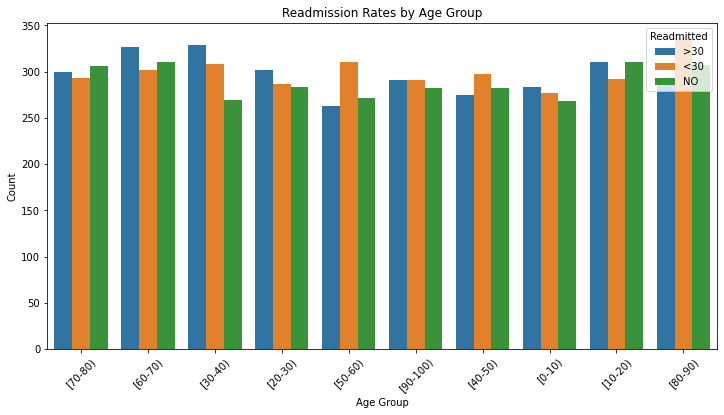

In [474]:
# Plotting readmission rates by age group
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x='age', hue='readmitted')
plt.title('Readmission Rates by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Readmitted')
plt.xticks(rotation=45)
plt.show()

### Time in Hospital by Readmission Status
Here, we use a box plot to analyze the distribution of `time_in_hospital` for patients with different readmission statuses. This plot provides information on the spread and median of hospital stay lengths, categorized by readmission status. By examining this, we can assess if there is a significant difference in hospital stay duration between readmitted and non-readmitted patients. Longer or shorter stays might correlate with different readmission risks, making this a valuable analysis.

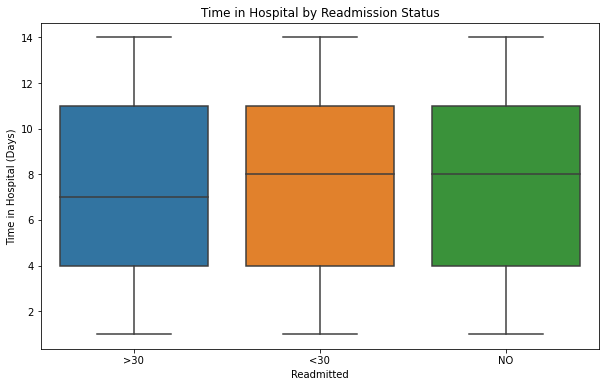

In [475]:
# Time in hospital vs. readmission
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='readmitted', y='time_in_hospital')
plt.title('Time in Hospital by Readmission Status')
plt.xlabel('Readmitted')
plt.ylabel('Time in Hospital (Days)')
plt.show()

### Readmission Rates by Gender
This visualization displays readmission counts for each gender, comparing those who were readmitted against those who were not. By including the `readmitted` status as a hue, we can examine if there is a noticeable difference in readmission rates between genders. This insight can help determine if gender is an influential factor in readmission likelihood, which could have implications for targeted interventions.

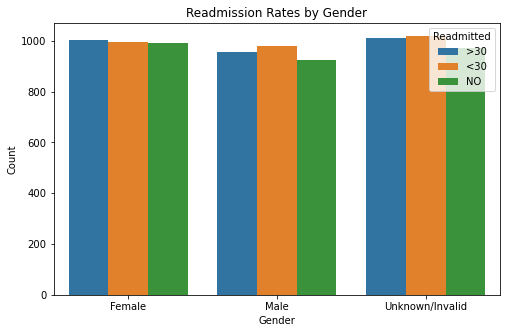

In [476]:
# Readmission rates by gender
plt.figure(figsize=(8, 5))
sns.countplot(data=data, x='gender', hue='readmitted')
plt.title('Readmission Rates by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Readmitted')
plt.show()

### Correlation Heatmap
The heatmap displays correlations between all numerical variables in the dataset, with each cell representing the correlation coefficient between two features. Darker colors indicate stronger correlations, whether positive or negative. This visualization helps in identifying which features are closely related to each other, which may aid in feature selection for the predictive model. Variables with high correlations to `readmitted` or each other can reveal important relationships that influence patient readmission risk.

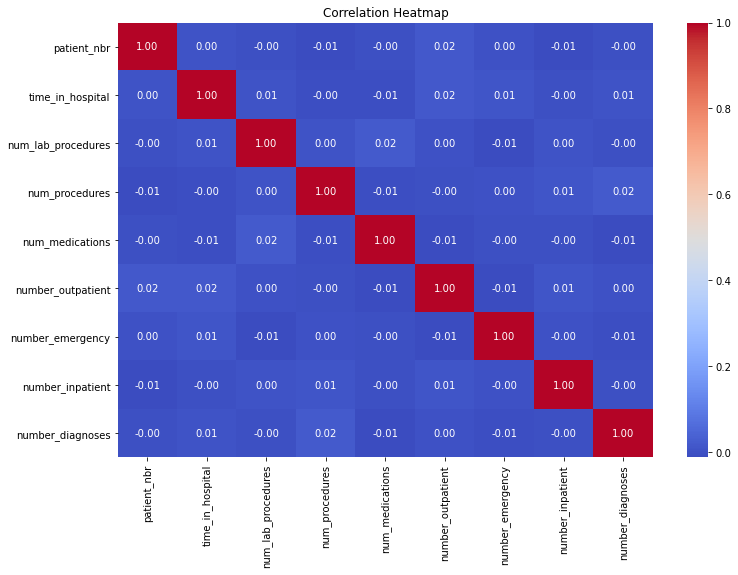

In [477]:
# Correlation heatmap for numerical features
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [478]:
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,Female,[70-80),[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,[60-70),[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,Unknown/Invalid,[30-40),>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,Male,[30-40),[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,Female,[20-30),[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


## 6. DROPPING COLUMNS IRRELEVANT TO OUR PREDICTION

In predictive modeling, it's important to select features that directly contribute to the outcome. For this project, we aim to predict patient readmissions, so columns that don't provide relevant information to this outcome—like non-medical information—can be safely dropped. Below, we will justify the removal of several columns that are not expected to affect readmission outcomes based on our exploratory data analysis (EDA).

### Dropping Irrelevant Columns Based on EDA Insights

After completing exploratory data analysis, we found that the `gender` and `age` columns do not significantly impact the readmission prediction outcome:

- **gender**: Analysis showed no strong correlation between patient gender and readmission rates in our dataset.
- **age**: Patient age alone does not provide significant predictive value for readmission. This is likely due to the variability in other health factors that have a more direct impact.

To improve model performance, we will remove these columns from the dataset.

In [479]:
# Dropping 'gender' and 'weight' columns based on EDA insights
columns_to_drop = ['gender', 'age']
data = data.drop(columns=columns_to_drop)

print("Dropped columns:", columns_to_drop)

Dropped columns: ['gender', 'age']


In [480]:
data.head()

,patient_nbr,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


## 7. MODELLING AND EVALUATION

## Linear Regession.

In [481]:
data.columns

Index(['patient_nbr', 'weight', 'time_in_hospital', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'number_diagnoses', 'diabetesMed', 'readmitted'],
      dtype='object')

In [482]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from itertools import combinations

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [483]:
data.shape

(8853, 13)

In [484]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


### Changing age and weight columns to numeric range variables

In [485]:
data.head()

,patient_nbr,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


In [486]:
import pandas as pd

# Sample structure of your original dataframe

# Function to clean weight values and retain the range format
def clean_age_range(age_str):
    # Remove unwanted characters
    age_str = age_str.strip('[]() >')  # Remove brackets, parentheses, and '>'
    return age_str  # Return the cleaned range as a string

# Apply the cleaning function to the weight column
data['age'] = data['age'].apply(clean_age_range)

# Display the updated dataframe with the original and cleaned weight column
print(data.head())  # Display the first few rows to check the result


KeyError: 'age'

In [ ]:
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,Female,70-80,[125-150),5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,60-70,[50-75),12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,Unknown/Invalid,30-40,>200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,Male,30-40,[75-100),14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,Female,20-30,[0-25),13,Psychology,114,3,21,18,37,21,11,No,NO


In [ ]:
import pandas as pd

# Sample structure of your original dataframe
# Assuming 'data' is your original dataframe with 8853 rows and the specified columns

# Function to clean weight values and retain the range format
def clean_weight_range(weight_str):
    # Remove unwanted characters
    weight_str = weight_str.strip('[]() >')  # Remove brackets, parentheses, and '>'
    return weight_str  # Return the cleaned range as a string

# Apply the cleaning function to the weight column
data['weight'] = data['weight'].apply(clean_weight_range)

# Display the updated dataframe with the original and cleaned weight column
print(data.head())  # Display the first few rows to check the result


   patient_nbr           gender    age   weight  time_in_hospital  \
3    161137462           Female  70-80  125-150                 5   
4    178987224             Male  60-70    50-75                12   
5    155688693  Unknown/Invalid  30-40      200                11   
6    148640105             Male  30-40   75-100                14   
7    179391750           Female  20-30     0-25                13   

    medical_specialty  num_lab_procedures  num_procedures  num_medications  \
3  InfectiousDiseases                  66               2                9   
4             DCPTEAM                  83               0               54   
5           Radiology                 110               3                4   
6          Psychiatry                 127               2               62   
7          Psychology                 114               3               21   

   number_outpatient  number_emergency  number_inpatient  number_diagnoses  \
3                 33                71

In [ ]:
data.head(8853)

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted
3,161137462,Female,70-80,125-150,5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30
4,178987224,Male,60-70,50-75,12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30
5,155688693,Unknown/Invalid,30-40,200,11,Radiology,110,3,4,38,0,10,8,No,>30
6,148640105,Male,30-40,75-100,14,Psychiatry,127,2,62,25,47,20,11,Yes,<30
7,179391750,Female,20-30,0-25,13,Psychology,114,3,21,18,37,21,11,No,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9998,53149599,Female,0-10,150-175,13,Hospitalist,68,3,27,1,39,11,6,No,>30
9999,156411072,Female,40-50,150-175,11,Pediatrics-CriticalCare,33,1,75,8,24,9,3,No,<30
10000,82988976,Unknown/Invalid,50-60,100-125,1,Surgery-Cardiovascular,80,0,11,24,9,18,14,Yes,>30
10001,57736672,Unknown/Invalid,20-30,100-125,1,Orthopedics-Reconstructive,80,6,17,12,5,20,1,No,>30


## 8. DIAGNOSED PATIENTS

### Performing linear regression based on columns age weight and number_diagnoses

In [ ]:
data.columns

Index(['patient_nbr', 'gender', 'age', 'weight', 'time_in_hospital',
       'medical_specialty', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'number_diagnoses', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:


# Encode categorical variables for age and weight
label_encoder_age = LabelEncoder()
label_encoder_weight = LabelEncoder()

data['age_encoded'] = label_encoder_age.fit_transform(data['age'])
data['weight_encoded'] = label_encoder_weight.fit_transform(data['weight'])

# Prepare the feature matrix (X) and target vector (y)
X = data[['age_encoded', 'weight_encoded']]
y = data['number_diagnoses']

# Fit the linear regression model
model = LinearRegression()
model.fit(X, y)

# Output the coefficients and intercept
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)


NameError: name 'LabelEncoder' is not defined

In [ ]:
# Encode categorical variables for age and weight
label_encoder_age = LabelEncoder()
label_encoder_weight = LabelEncoder()

data['age_encoded'] = label_encoder_age.fit_transform(data['age'])
data['weight_encoded'] = label_encoder_weight.fit_transform(data['weight'])

# Prepare the feature matrix (X) and target vector (y)
X = data[['age_encoded', 'weight_encoded']]
y = data['number_diagnoses']

# Fit the linear regression model
model = LinearRegression()
model.fit(X, y)

# Make predictions
predictions = model.predict(X)

# Output the coefficients and intercept
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

# Display predictions
print("Predictions:", predictions)

# Evaluate the model
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)
print("Mean Squared Error:", mse)
print("R-squared:", r2)


Coefficients: [-0.02008955  0.00402946]
Intercept: 8.656117421875344
Predictions: [8.52354947 8.56378632 8.61599606 ... 8.55969911 8.61996777 8.58784759]
Mean Squared Error: 20.862439477397537
R-squared: 0.0001628624024430092


### Coefficients and Intercept in the Context of Diabetic Cases
#### Coefficients:

Age Coefficient (-0.0201): For each unit increase in the encoded age variable (representing different age ranges), the model predicts a slight decrease of about 0.0201 in the number of diabetes-related diagnoses. This could imply that, within the specified age ranges, older patients may have fewer recorded diabetes diagnoses, which could be due to various factors like differences in healthcare access, treatment protocols, or reporting practices among age groups.

Weight Coefficient (0.0040): For each unit increase in the encoded weight variable (representing different weight ranges), the model predicts an increase of about 0.0040 in the number of diabetes-related diagnoses. This suggests that as patients' weights increase (within the defined weight categories), they tend to have slightly more diabetes-related diagnoses, which aligns with the understanding that obesity is a risk factor for diabetes.

Intercept (8.6561): This value represents the expected number of diabetes-related diagnoses when both the age and weight are at their baseline (the lowest categories). It serves as a reference point for understanding how age and weight affect the number of diagnoses.

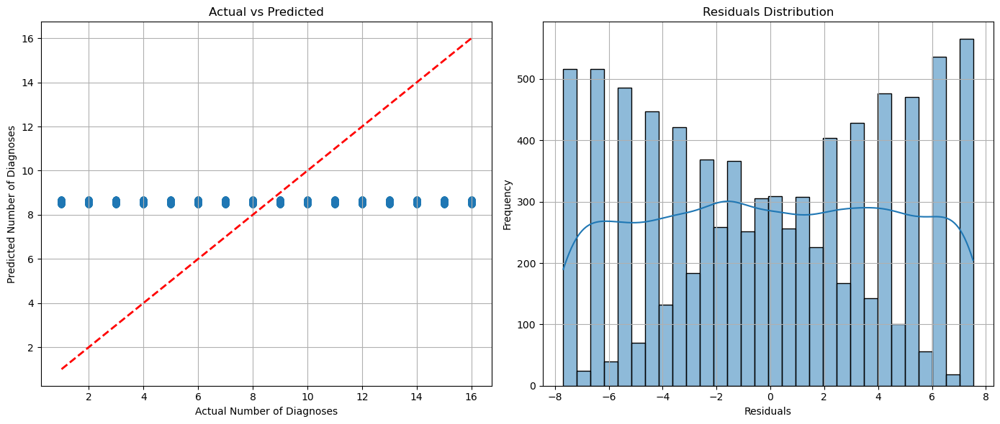

Mean Squared Error: 20.862439477397537
R-squared: 0.0001628624024430092


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score



# Encode categorical variables for age and weight
label_encoder_age = LabelEncoder()
label_encoder_weight = LabelEncoder()

data['age_encoded'] = label_encoder_age.fit_transform(data['age'])
data['weight_encoded'] = label_encoder_weight.fit_transform(data['weight'])

# Prepare the feature matrix (X) and target vector (y)
X = data[['age_encoded', 'weight_encoded']]
y = data['number_diagnoses']

# Fit the linear regression model
model = LinearRegression()
model.fit(X, y)

# Make predictions
predictions = model.predict(X)

# Evaluate the model
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)

# Plotting the results
plt.figure(figsize=(14, 6))

# Scatter plot of actual vs predicted values
plt.subplot(1, 2, 1)
plt.scatter(y, predictions, alpha=0.5)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)  # Diagonal line
plt.title('Actual vs Predicted')
plt.xlabel('Actual Number of Diagnoses')
plt.ylabel('Predicted Number of Diagnoses')
plt.grid(True)

# Residuals plot
plt.subplot(1, 2, 2)
residuals = y - predictions
sns.histplot(residuals, bins=30, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

# Output metrics
print("Mean Squared Error:", mse)
print("R-squared:", r2)


The analysis of the relationship between age, weight, and the number of diabetes-related diagnoses using linear regression has revealed several key insights:

### Model Performance:

The 'Mean Squared Error (MSE)' of approximately 20.86 indicates that the predictions made by the model significantly deviate from the actual number of diabetes diagnoses. This suggests that the model struggles to accurately predict outcomes based solely on age and weight.
The R-squared (R²) value of about 0.00016 implies that only a tiny fraction (approximately 0.016%) of the variability in diabetes diagnoses can be explained by age and weight alone. This indicates that the model is not capturing the complexity of diabetes diagnoses effectively.
Relationships:

The coefficients suggest a slight negative relationship between age and diabetes diagnoses, where older age may be associated with fewer recorded diagnoses. Conversely, there is a minor positive relationship between weight and the number of diagnoses, indicating that higher weight could be associated with more diagnoses.
Importance of Additional Factors:

The low R-squared value highlights that age and weight are likely insufficient to explain the variations in diabetes diagnoses. Other crucial factors—such as lifestyle choices (e.g., diet and physical activity), genetic predisposition, medical history, medication adherence, socioeconomic status, and other health conditions—may play a significant role and should be considered in future analyses.
Recommendations:

To improve the predictive power of the model, it is recommended to explore additional variables that may influence diabetes diagnoses.
Consider using more advanced modeling techniques, such as multiple regression or machine learning algorithms, that can handle interactions between multiple factors and capture non-linear relationships.
Further data collection and analysis of relevant clinical, demographic, and lifestyle factors could provide deeper insights into the determinants of diabetes diagnoses.

In [ ]:
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted,age_encoded,weight_encoded
3,161137462,Female,7,2,5,InfectiousDiseases,66,2,9,33,71,18,1,No,>30,7,2
4,178987224,Male,6,7,12,DCPTEAM,83,0,54,37,14,1,6,Yes,>30,6,7
5,155688693,Unknown/Invalid,3,5,11,Radiology,110,3,4,38,0,10,8,No,>30,3,5
6,148640105,Male,3,8,14,Psychiatry,127,2,62,25,47,20,11,Yes,<30,3,8
7,179391750,Female,2,0,13,Psychology,114,3,21,18,37,21,11,No,NO,2,0


### Univariate analysis for examining each variable in the dataset individually to understand; distribution, central tendency, variability, and any patterns or anomalies.

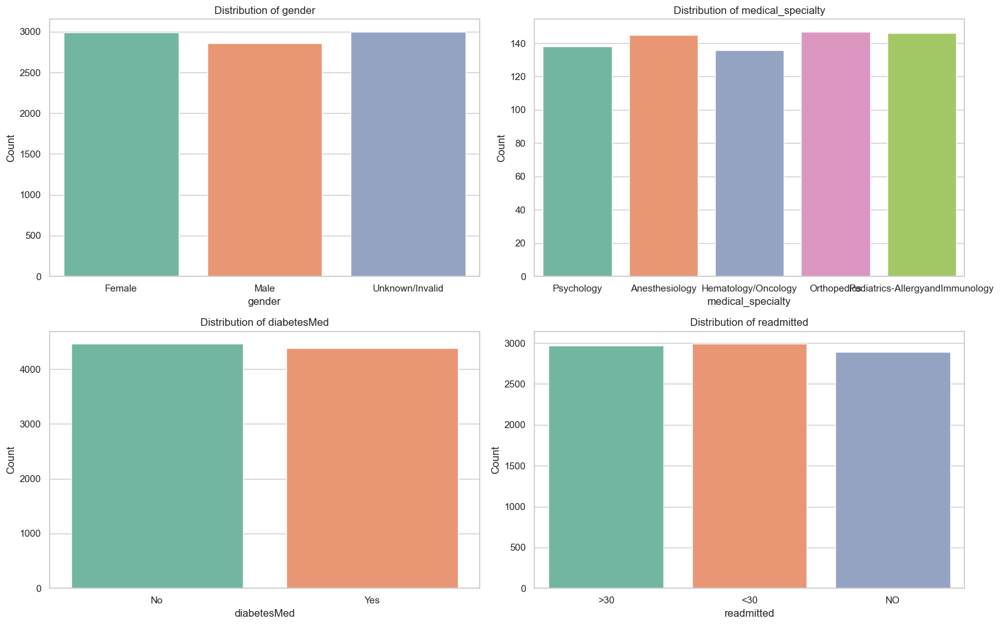

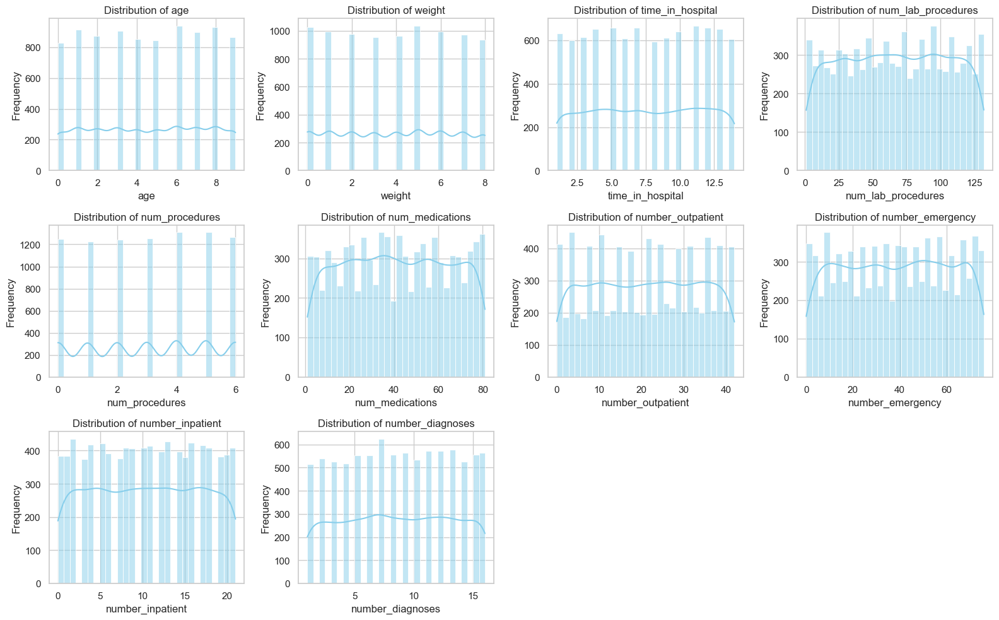

Summary Statistics for Numerical Variables:
                age       weight  time_in_hospital  num_lab_procedures  \
count  8853.000000  8853.000000       8853.000000         8853.000000   
mean      4.537671     3.964645          7.534508           66.791596   
std       2.861952     2.580470          4.024309           37.995975   
min       0.000000     0.000000          1.000000            1.000000   
25%       2.000000     2.000000          4.000000           34.000000   
50%       5.000000     4.000000          8.000000           67.000000   
75%       7.000000     6.000000         11.000000           99.000000   
max       9.000000     8.000000         14.000000          132.000000   

       num_procedures  num_medications  number_outpatient  number_emergency  \
count     8853.000000      8853.000000        8853.000000       8853.000000   
mean         3.031402        41.333107          21.043375         38.245679   
std          1.997379        23.277760          12.415959   

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame

# Step 1: Calculate counts of each medical specialty
top_specialties = data['medical_specialty'].value_counts().nlargest(5).index

# Step 2: Filter the DataFrame to include only top 20 specialties
data_top_specialties = data[data['medical_specialty'].isin(top_specialties)]

# Univariate Analysis for Categorical Variables including limited medical_specialty
categorical_vars = ['gender', 'medical_specialty', 'diabetesMed', 'readmitted']

plt.figure(figsize=(16, 10))

for i, var in enumerate(categorical_vars):
    plt.subplot(2, 2, i + 1)
    # If the variable is medical_specialty, use filtered DataFrame
    if var == 'medical_specialty':
        sns.countplot(data=data_top_specialties, x=var, palette='Set2')
    else:
        sns.countplot(data=data, x=var, palette='Set2')
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Summary statistics for numerical variables
numerical_vars = ['age', 'weight', 'time_in_hospital', 'num_lab_procedures', 
                  'num_procedures', 'num_medications', 'number_outpatient', 
                  'number_emergency', 'number_inpatient', 'number_diagnoses']

plt.figure(figsize=(16, 10))

for i, var in enumerate(numerical_vars):
    plt.subplot(3, 4, i + 1)
    sns.histplot(data[var], bins=30, kde=True, color='skyblue')
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Summary statistics for numerical variables
summary_stats = data[numerical_vars].describe()
print("Summary Statistics for Numerical Variables:\n", summary_stats)


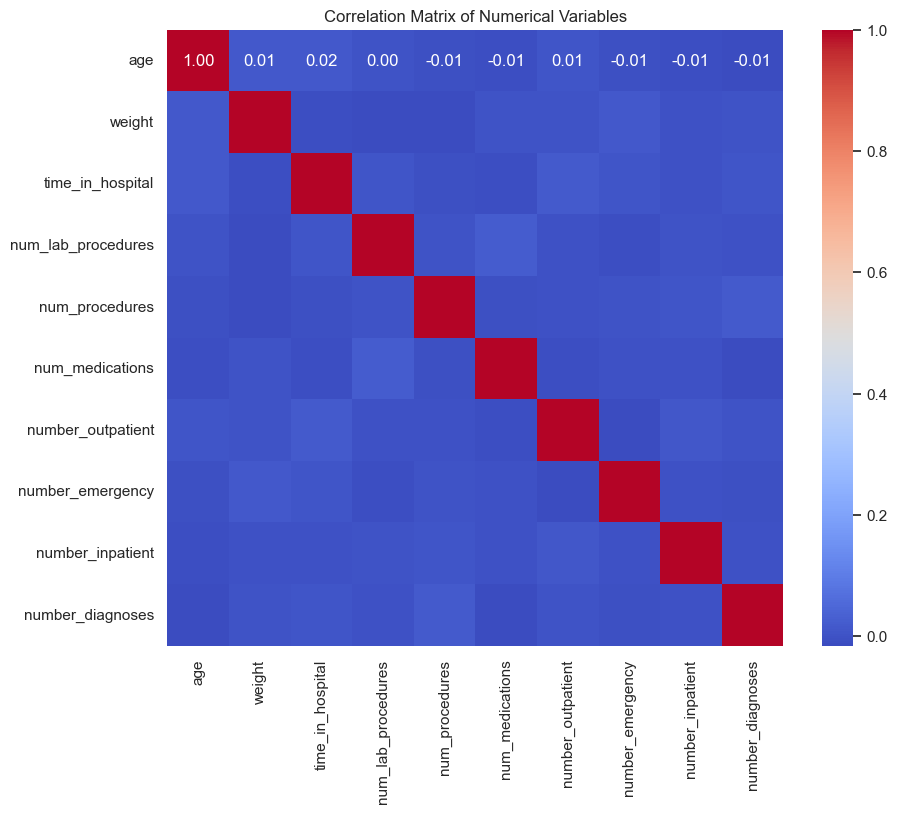

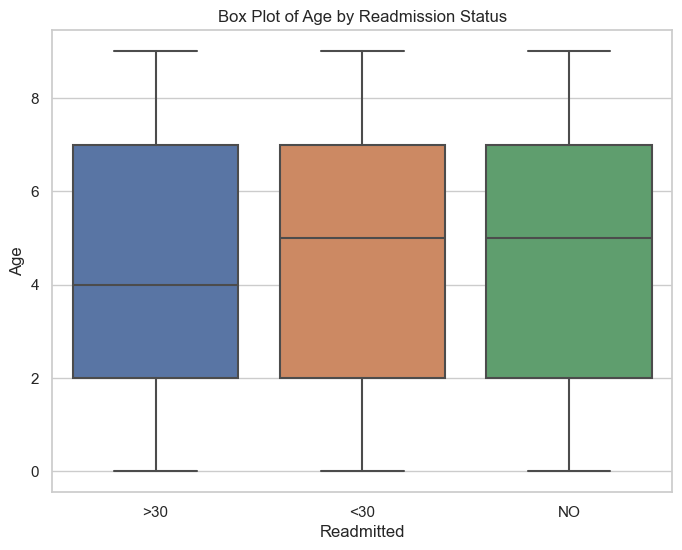

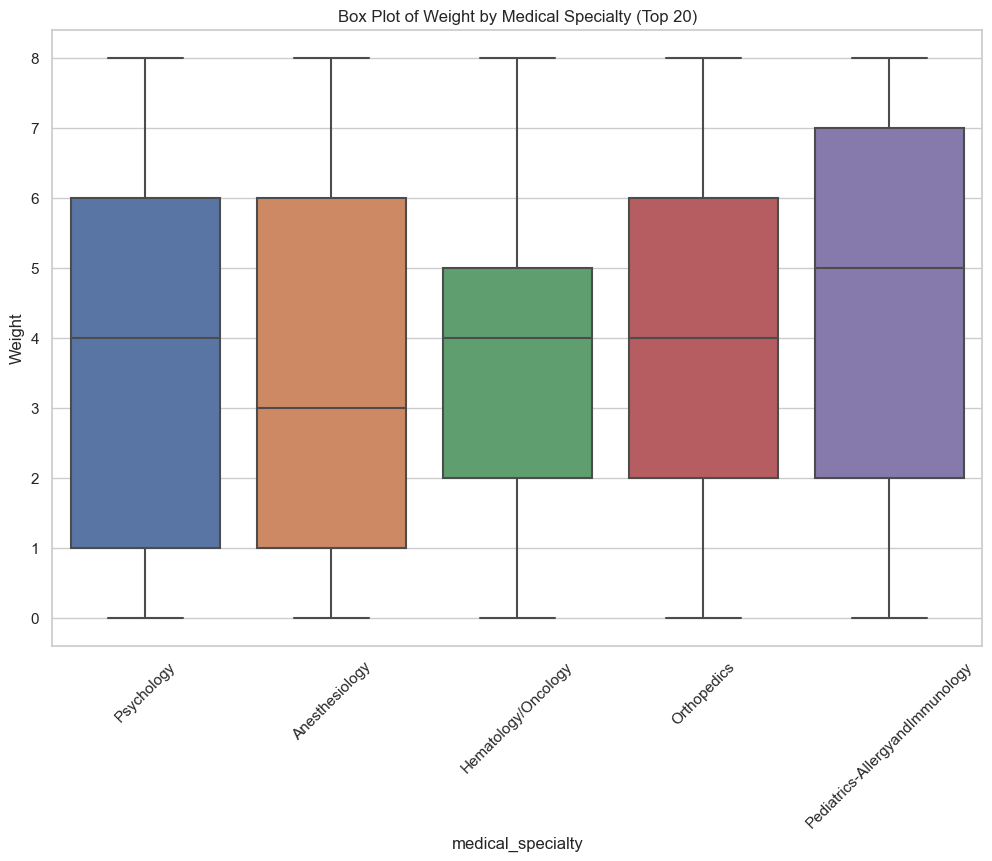

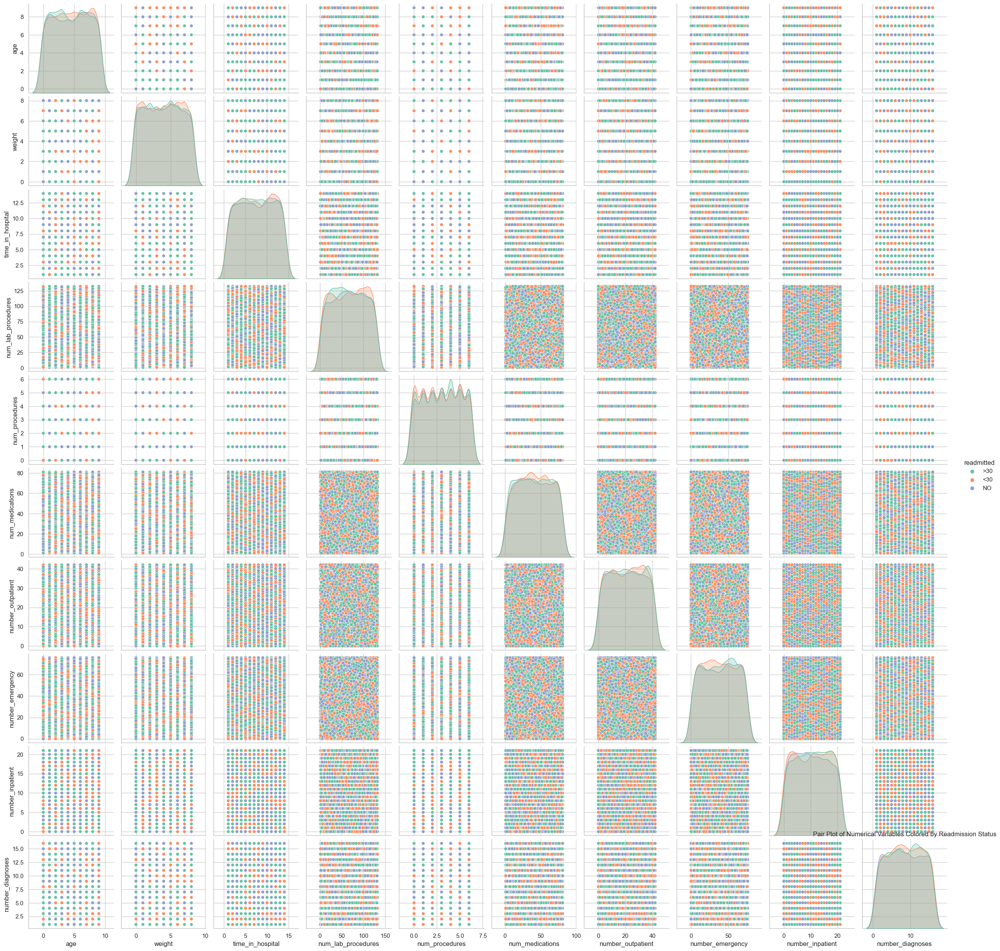

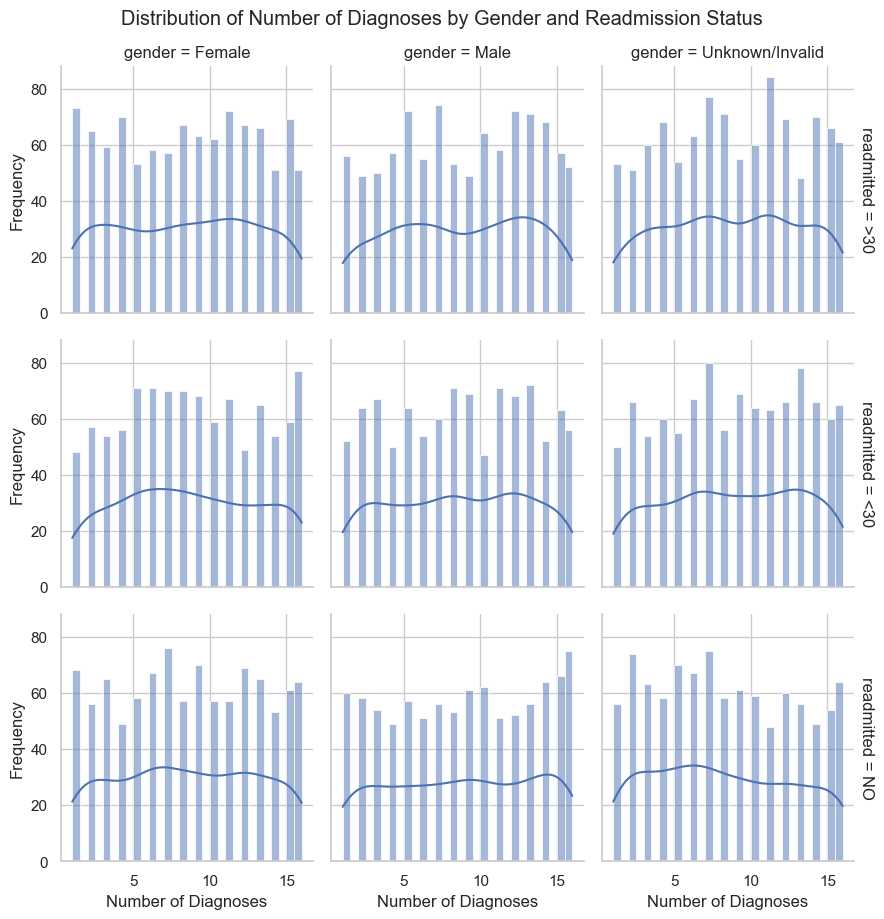

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# 1. Correlation Matrix for Numerical Variables
correlation_matrix = data[numerical_vars].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

# 2. Box Plots: Age vs. Readmitted
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='readmitted', y='age')
plt.title('Box Plot of Age by Readmission Status')
plt.xlabel('Readmitted')
plt.ylabel('Age')
plt.show()

# 3. Box Plots: Weight vs. Medical Specialty
plt.figure(figsize=(12, 8))
sns.boxplot(data=data_top_specialties, x='medical_specialty', y='weight')
plt.title('Box Plot of Weight by Medical Specialty (Top 20)')
plt.xticks(rotation=45)
plt.ylabel('Weight')
plt.show()

# 4. Pair Plots: Numerical Variables Colored by Readmission Status
sns.pairplot(data, hue='readmitted', vars=numerical_vars, palette='Set2')
plt.title('Pair Plot of Numerical Variables Colored by Readmission Status')
plt.show()

# 5. Facet Grid: Number of Diagnoses by Age and Gender
g = sns.FacetGrid(data, col='gender', row='readmitted', margin_titles=True)
g.map(sns.histplot, 'number_diagnoses', bins=30, kde=True)
g.set_axis_labels('Number of Diagnoses', 'Frequency')
g.fig.suptitle('Distribution of Number of Diagnoses by Gender and Readmission Status', y=1.02)
plt.show()


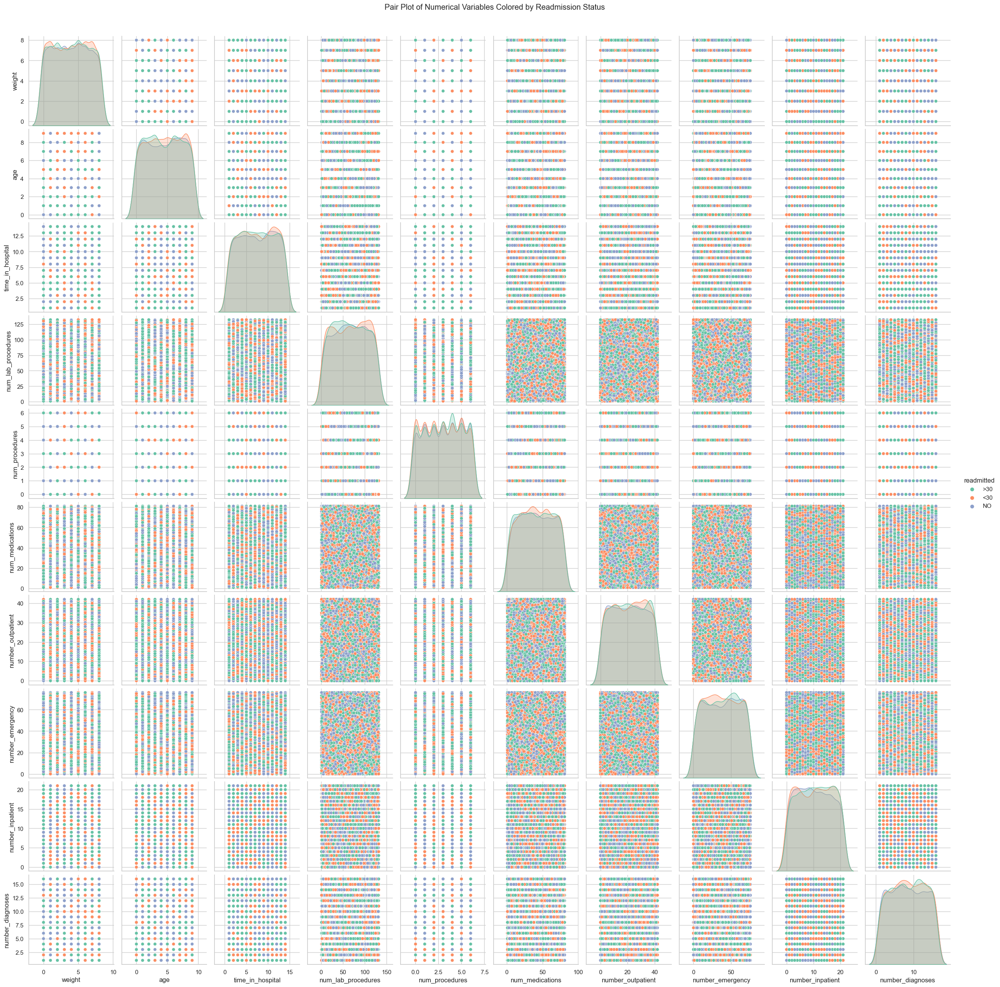

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame

# Specify the numerical variables to include in the pair plot
numerical_vars = ['weight', 'age', 'time_in_hospital', 'num_lab_procedures', 
                  'num_procedures', 'num_medications', 'number_outpatient', 
                  'number_emergency', 'number_inpatient', 'number_diagnoses']

# Create pair plots with 'readmitted' status as hue
pair_plot = sns.pairplot(data, hue='readmitted', vars=numerical_vars, palette='Set2')
pair_plot.fig.suptitle('Pair Plot of Numerical Variables Colored by Readmission Status', y=1.02)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Assuming 'data' is your DataFrame

# Select numerical variables for transformation
numerical_vars = ['age', 'weight', 'time_in_hospital', 'num_lab_procedures', 
                  'num_procedures', 'num_medications', 'number_outpatient', 
                  'number_emergency', 'number_inpatient', 'number_diagnoses']

# Create a copy of the DataFrame to hold transformed data
data_transformed = data.copy()

# 1. Standardization (Z-score Normalization)
scaler = StandardScaler()
data_transformed[numerical_vars] = scaler.fit_transform(data[numerical_vars])

# 2. Min-Max Normalization
min_max_scaler = MinMaxScaler()
data_transformed[numerical_vars] = min_max_scaler.fit_transform(data[numerical_vars])

# 3. Log Transformation
# Apply log transformation; add a small constant to avoid log(0)
data_transformed[numerical_vars] = np.log1p(data[numerical_vars])

# Display the first few rows of the transformed DataFrame
print(data_transformed[numerical_vars].head())


        age    weight  time_in_hospital  num_lab_procedures  num_procedures  \
3  2.079442  1.098612          1.791759            4.204693        1.098612   
4  1.945910  2.079442          2.564949            4.430817        0.000000   
5  1.386294  1.791759          2.484907            4.709530        1.386294   
6  1.386294  2.197225          2.708050            4.852030        1.098612   
7  1.098612  0.000000          2.639057            4.744932        1.386294   

   num_medications  number_outpatient  number_emergency  number_inpatient  \
3         2.302585           3.526361          4.276666          2.944439   
4         4.007333           3.637586          2.708050          0.693147   
5         1.609438           3.663562          0.000000          2.397895   
6         4.143135           3.258097          3.871201          3.044522   
7         3.091042           2.944439          3.637586          3.091042   

   number_diagnoses  
3          0.693147  
4          1.94591

In [ ]:
data_transformed[numerical_vars].head()

,age,weight,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
3,2.079442,1.098612,1.791759,4.204693,1.098612,2.302585,3.526361,4.276666,2.944439,0.693147
4,1.945910,2.079442,2.564949,4.430817,0.000000,4.007333,3.637586,2.708050,0.693147,1.945910
5,1.386294,1.791759,2.484907,4.709530,1.386294,1.609438,3.663562,0.000000,2.397895,2.197225
6,1.386294,2.197225,2.708050,4.852030,1.098612,4.143135,3.258097,3.871201,3.044522,2.484907
7,1.098612,0.000000,2.639057,4.744932,1.386294,3.091042,2.944439,3.637586,3.091042,2.484907


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np

# Assuming 'data' is your DataFrame

# Select the feature to scale
feature_to_scale = 'weight'

# Create a copy of the DataFrame to hold transformed data
data_scaled = data.copy()

# 1. Standardization (Z-score Normalization)
scaler = StandardScaler()
data_scaled[feature_to_scale] = scaler.fit_transform(data[[feature_to_scale]])

# Display the first few rows of the scaled DataFrame
print("Standardized Weight:\n", data_scaled[[feature_to_scale]].head())

# 2. Min-Max Normalization
min_max_scaler = MinMaxScaler()
data_scaled[feature_to_scale] = min_max_scaler.fit_transform(data[[feature_to_scale]])

# Display the first few rows of the scaled DataFrame
print("Min-Max Normalized Weight:\n", data_scaled[[feature_to_scale]].head())

# 3. Log Transformation
# Apply log transformation; add a small constant to avoid log(0)
data_scaled[feature_to_scale] = np.log1p(data[feature_to_scale])

# Display the first few rows of the scaled DataFrame after log transformation
print("Log Transformed Weight:\n", data_scaled[[feature_to_scale]].head())


Standardized Weight:
      weight
3 -0.761394
4  1.176346
5  0.401250
6  1.563894
7 -1.536491
Min-Max Normalized Weight:
    weight
3   0.250
4   0.875
5   0.625
6   1.000
7   0.000
Log Transformed Weight:
      weight
3  1.098612
4  2.079442
5  1.791759
6  2.197225
7  0.000000


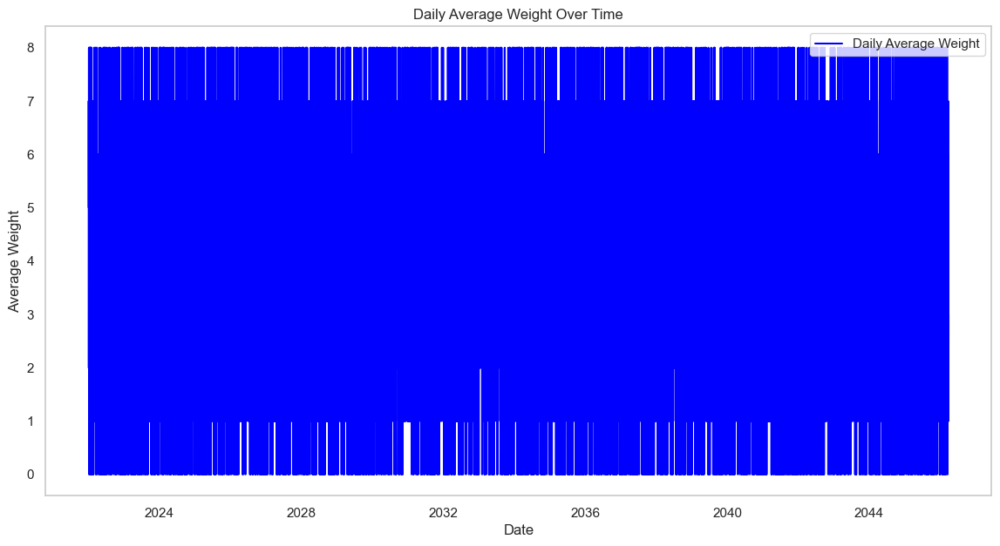

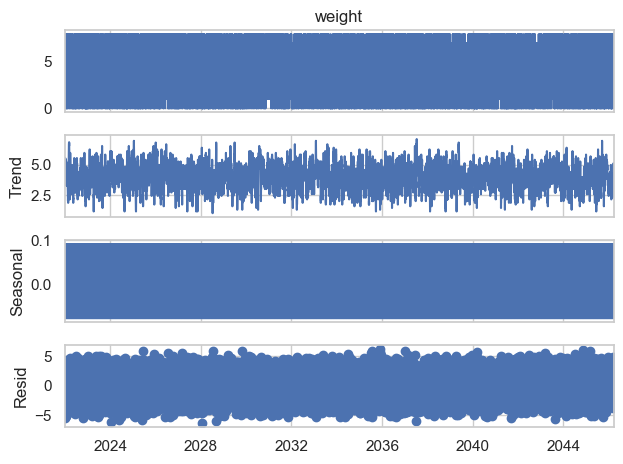

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame

# Step 1: Create a synthetic datetime column (if not present)
# For demonstration, let's create a date range
# Assuming we have 8853 rows and want a daily range starting from a specific date
data['date'] = pd.date_range(start='2022-01-01', periods=len(data), freq='D')

# Step 2: Set the date as the index for time series analysis
data.set_index('date', inplace=True)

# Step 3: Aggregate data (e.g., average weight per day)
# You can aggregate based on other features as well, depending on your analysis
daily_avg_weight = data['weight'].resample('D').mean()

# Step 4: Visualize the Time Series
plt.figure(figsize=(14, 7))
plt.plot(daily_avg_weight, color='blue', label='Daily Average Weight')
plt.title('Daily Average Weight Over Time')
plt.xlabel('Date')
plt.ylabel('Average Weight')
plt.legend()
plt.grid()
plt.show()

# Optional: Decomposition (if needed)
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
decomposed = seasonal_decompose(daily_avg_weight, model='additive')
decomposed.plot()
plt.show()


In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame

# Step 1: Sort the DataFrame by 'weight' in descending order
top_20_data = data.sort_values(by='weight', ascending=False).head(20)

# Display the top 20 entries
print("Top 20 Entries Based on Weight:\n", top_20_data)


Top 20 Entries Based on Weight:
             patient_nbr           gender  age  weight  time_in_hospital  \
date                                                                      
2033-06-26    180540448  Unknown/Invalid    8       8                 8   
2027-11-29     49930055             Male    7       8                 9   
2024-05-19    125838945             Male    5       8                10   
2044-09-03     53642081           Female    4       8                 8   
2032-08-15    106673566  Unknown/Invalid    4       8                14   
2024-05-11     55147228             Male    9       8                14   
2032-08-16    100495146             Male    6       8                12   
2031-07-08     60998594             Male    2       8                 9   
2037-08-26    112836373             Male    6       8                 3   
2027-11-11    119889671             Male    0       8                 8   
2042-04-25     98991851  Unknown/Invalid    0       8              

In [ ]:
top_20_data.head(20)

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted,age_encoded,weight_encoded
date,,,,,,,,,,,,,,,,,
2033-06-26,180540448,Unknown/Invalid,8,8,8,Surgery-Colon&Rectal,64,6,40,23,70,10,4,No,>30,8,8
2027-11-29,49930055,Male,7,8,9,Surgery-PlasticwithinHeadandNeck,120,5,80,18,11,17,1,No,<30,7,8
2024-05-19,125838945,Male,5,8,10,Gastroenterology,1,3,72,38,45,6,14,No,NO,5,8
2044-09-03,53642081,Female,4,8,8,Surgery-Maxillofacial,46,6,26,39,13,16,5,No,NO,4,8
2032-08-15,106673566,Unknown/Invalid,4,8,14,SportsMedicine,111,6,68,4,45,21,6,Yes,>30,4,8
2024-05-11,55147228,Male,9,8,14,Anesthesiology-Pediatric,53,0,68,23,29,10,8,No,<30,9,8
2032-08-16,100495146,Male,6,8,12,Obstetrics,86,0,4,1,41,17,6,Yes,NO,6,8
2031-07-08,60998594,Male,2,8,9,Speech,72,2,1,27,73,0,11,Yes,NO,2,8
2037-08-26,112836373,Male,6,8,3,Surgery-Colon&Rectal,102,5,68,12,62,16,4,Yes,NO,6,8


In [ ]:
# After aggregating daily average weight
daily_avg_weight = data['weight'].resample('D').mean()

# Reset index to sort by average weight
daily_avg_weight = daily_avg_weight.reset_index()

# Step 1: Sort and limit to top 20
top_20_avg_weight = daily_avg_weight.sort_values(by='weight', ascending=False).head(20)

# Display the top 20 daily averages
print("Top 20 Daily Average Weights:\n", top_20_avg_weight)


Top 20 Daily Average Weights:
            date  weight
4194 2033-06-26     8.0
2158 2027-11-29     8.0
869  2024-05-19     8.0
8281 2044-09-03     8.0
3879 2032-08-15     8.0
861  2024-05-11     8.0
3880 2032-08-16     8.0
3475 2031-07-08     8.0
5716 2037-08-26     8.0
2140 2027-11-11     8.0
7419 2042-04-25     8.0
852  2024-05-02     8.0
2167 2027-12-08     8.0
2169 2027-12-10     8.0
847  2024-04-27     8.0
2181 2027-12-22     8.0
8275 2044-08-28     8.0
874  2024-05-24     8.0
4678 2034-10-23     8.0
7456 2042-06-01     8.0


In [ ]:
top_20_avg_weight.head(20)

,date,weight
4194,2033-06-26,8.0
2158,2027-11-29,8.0
869,2024-05-19,8.0
8281,2044-09-03,8.0
3879,2032-08-15,8.0
861,2024-05-11,8.0
3880,2032-08-16,8.0
3475,2031-07-08,8.0
5716,2037-08-26,8.0
2140,2027-11-11,8.0


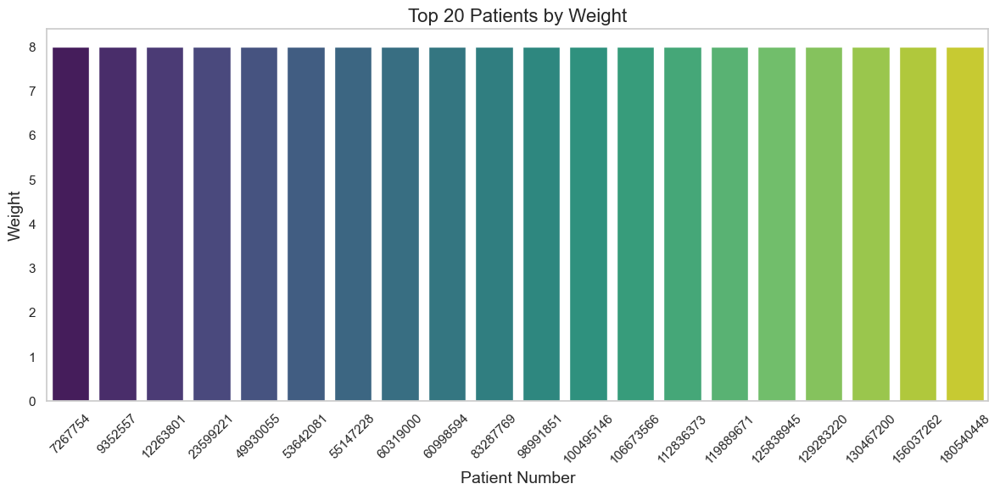

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame

# Step 1: Sort the DataFrame by 'weight' in descending order and get the top 20
top_20_data = data.sort_values(by='weight', ascending=False).head(20)

# Step 2: Set up the bar graph
plt.figure(figsize=(12, 6))
sns.barplot(x='patient_nbr', y='weight', data=top_20_data, palette='viridis')

# Step 3: Customize the plot
plt.title('Top 20 Patients by Weight', fontsize=16)
plt.xlabel('Patient Number', fontsize=14)
plt.ylabel('Weight', fontsize=14)
plt.xticks(rotation=45)  # Rotate patient numbers for better readability
plt.grid(axis='y')

# Step 4: Show the plot
plt.tight_layout()  # Adjust layout for better display
plt.show()


In [ ]:
data.head()

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted,age_encoded,weight_encoded
date,,,,,,,,,,,,,,,,,
2022-01-01,161137462,Female,7,2,5,InfectiousDiseases,66,2,9,33,71,18,1,No,NaN,7,2
2022-01-02,178987224,Male,6,7,12,DCPTEAM,83,0,54,37,14,1,6,Yes,NaN,6,7
2022-01-03,155688693,Unknown/Invalid,3,5,11,Radiology,110,3,4,38,0,10,8,No,NaN,3,5
2022-01-04,148640105,Male,3,8,14,Psychiatry,127,2,62,25,47,20,11,Yes,NaN,3,8
2022-01-05,179391750,Female,2,0,13,Psychology,114,3,21,18,37,21,11,No,NaN,2,0


In [ ]:
data.head(8853)

,patient_nbr,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,diabetesMed,readmitted,age_encoded,weight_encoded
date,,,,,,,,,,,,,,,,,
2022-01-01,161137462,Female,7,2,5,InfectiousDiseases,66,2,9,33,71,18,1,No,NaN,7,2
2022-01-02,178987224,Male,6,7,12,DCPTEAM,83,0,54,37,14,1,6,Yes,NaN,6,7
2022-01-03,155688693,Unknown/Invalid,3,5,11,Radiology,110,3,4,38,0,10,8,No,NaN,3,5
2022-01-04,148640105,Male,3,8,14,Psychiatry,127,2,62,25,47,20,11,Yes,NaN,3,8
2022-01-05,179391750,Female,2,0,13,Psychology,114,3,21,18,37,21,11,No,NaN,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046-03-24,53149599,Female,0,3,13,Hospitalist,68,3,27,1,39,11,6,No,NaN,0,3
2046-03-25,156411072,Female,4,3,11,Pediatrics-CriticalCare,33,1,75,8,24,9,3,No,NaN,4,3
2046-03-26,82988976,Unknown/Invalid,5,1,1,Surgery-Cardiovascular,80,0,11,24,9,18,14,Yes,NaN,5,1


In [ ]:
data_transformed[numerical_vars].head(8853)

,age,weight,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
3,2.079442,1.098612,1.791759,4.204693,1.098612,2.302585,3.526361,4.276666,2.944439,0.693147
4,1.945910,2.079442,2.564949,4.430817,0.000000,4.007333,3.637586,2.708050,0.693147,1.945910
5,1.386294,1.791759,2.484907,4.709530,1.386294,1.609438,3.663562,0.000000,2.397895,2.197225
6,1.386294,2.197225,2.708050,4.852030,1.098612,4.143135,3.258097,3.871201,3.044522,2.484907
7,1.098612,0.000000,2.639057,4.744932,1.386294,3.091042,2.944439,3.637586,3.091042,2.484907
...,...,...,...,...,...,...,...,...,...,...
9998,0.000000,1.386294,2.639057,4.234107,1.386294,3.332205,0.693147,3.688879,2.484907,1.945910
9999,1.609438,1.386294,2.484907,3.526361,0.693147,4.330733,2.197225,3.218876,2.302585,1.386294
10000,1.791759,0.693147,0.693147,4.394449,0.000000,2.484907,3.218876,2.302585,2.944439,2.708050
10001,1.098612,0.693147,0.693147,4.394449,1.945910,2.890372,2.564949,1.791759,3.044522,0.693147


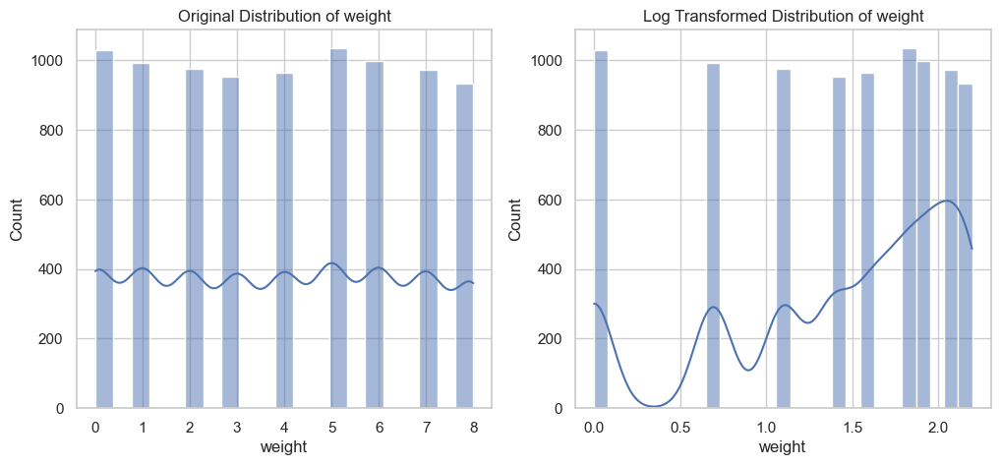

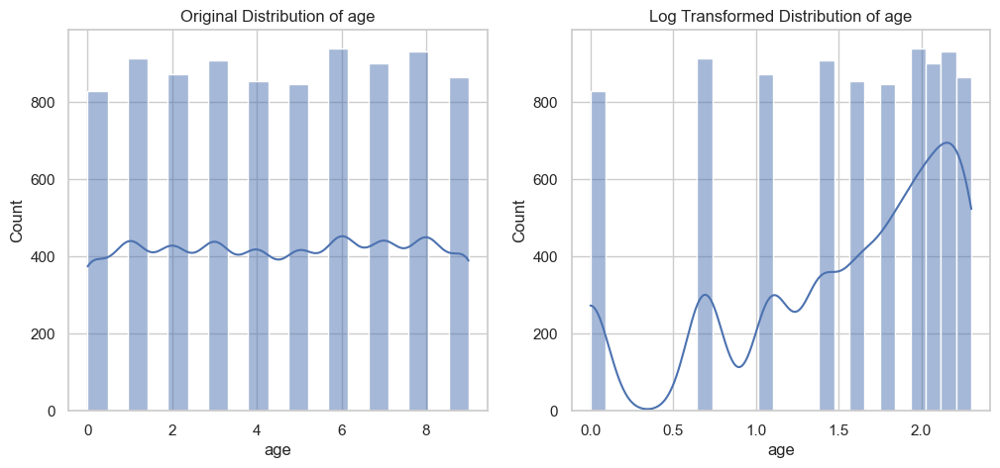

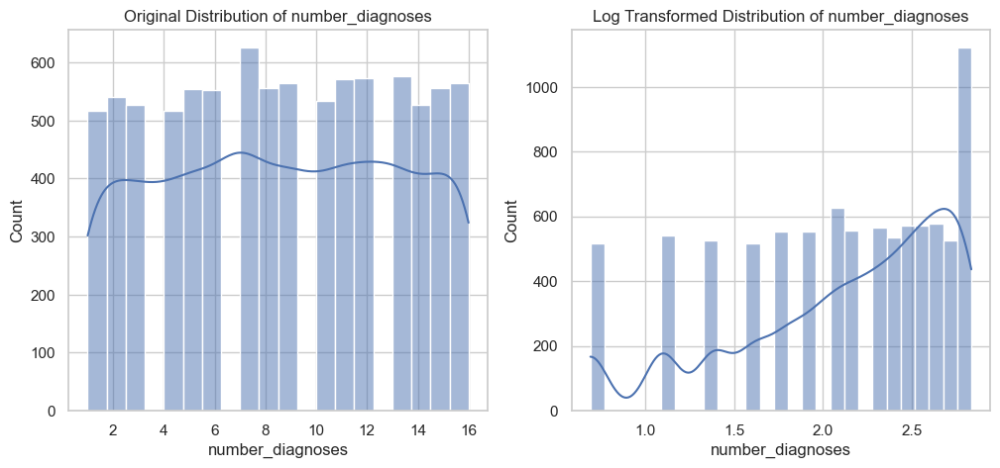

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame and has numeric columns

# Step 1: Select features for log transformation
features_to_transform = ['weight', 'age', 'number_diagnoses']  # Replace with relevant feature names

# Step 2: Apply log transformation (using np.log1p to handle zero values)
data_log_transformed = data.copy()
for feature in features_to_transform:
    data_log_transformed[feature] = np.log1p(data[feature])

# Step 3: Display before and after transformation
for feature in features_to_transform:
    plt.figure(figsize=(12, 5))

    # Original Distribution
    plt.subplot(1, 2, 1)
    sns.histplot(data[feature], kde=True)
    plt.title(f'Original Distribution of {feature}')

    # Log Transformed Distribution
    plt.subplot(1, 2, 2)
    sns.histplot(data_log_transformed[feature], kde=True)
    plt.title(f'Log Transformed Distribution of {feature}')

    plt.show()


In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Assuming 'data' is your DataFrame and has a DateTime index or a date column
# For example, if using 'time_in_hospital' aggregated daily, first create a time series:

# Step 1: Resample or use the time series directly
# Uncomment the following if you have a date column; otherwise, ensure 'data' is time-indexed.
# data['date'] = pd.to_datetime(data['date_column'])
# data.set_index('date', inplace=True)

# Aggregate by day, if needed:
time_series_data = data['time_in_hospital'].resample('D').mean()  # Adjust column if necessary

# Step 2: Run the ADF test
adf_result = adfuller(time_series_data.dropna())  # Drop NaN values if present

# Step 3: Display results
print(f"ADF Statistic: {adf_result[0]}")
print(f"p-value: {adf_result[1]}")
for key, value in adf_result[4].items():
    print(f'Critical Value ({key}): {value}')

# Interpretation
if adf_result[1] < 0.05:
    print("The time series is stationary (reject the null hypothesis).")
else:
    print("The time series is non-stationary (fail to reject the null hypothesis).")


ADF Statistic: -55.7425939871214
p-value: 0.0
Critical Value (1%): -3.4310891183884
Critical Value (5%): -2.8618666416869267
Critical Value (10%): -2.566943866373009
The time series is stationary (reject the null hypothesis).


#### The results of the Augmented Dickey-Fuller (ADF) test tell us that the trends in this data are stable over time, meaning the underlying characteristics, like average values and variability, don’t drift or change much as time goes on. This stability in the data is called stationarity.
### What the Test Results Mean
ADF Statistic: A highly negative value of -55.74 indicates a strong tendency towards stationarity.
p-value: The p-value is effectively zero, meaning there’s a very strong likelihood the data is stationary rather than non-stationary.
Critical Values: The critical values serve as benchmarks, and our ADF Statistic surpasses these, strongly suggesting stationarity.
#### Practical Implications
Since the time series data is stationary, we can move forward with confidence that the average and variability in our observations are consistent. This makes it suitable for applying predictive models directly, without needing transformations to remove trends or seasonality. For instance, if we’re analyzing something like patient readmission rates over time, this stability implies that any prediction model can rely on the data’s past behavior to inform future estimates.








## Time Series

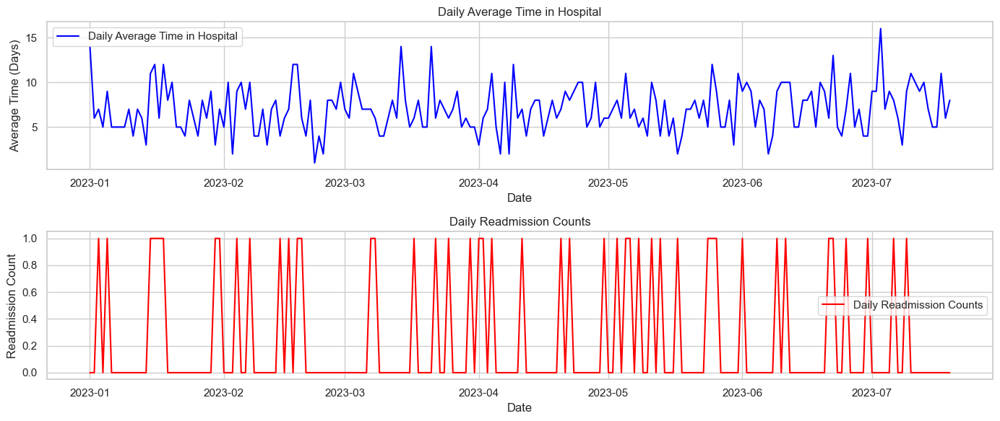

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Generate sample data based on the user's structure for demonstration
np.random.seed(0)
date_range = pd.date_range(start="2023-01-01", periods=200, freq="D")
data = pd.DataFrame({
    "date": date_range,
    "time_in_hospital": np.random.poisson(7, size=200),  # Simulated hospital time data
    "readmitted": np.random.choice(["Yes", "No"], size=200, p=[0.2, 0.8])  # Simulated readmission data
})

# Convert 'date' column to DateTime and set as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Resample for daily time series analysis
# Calculate daily average 'time_in_hospital'
daily_time_in_hospital = data['time_in_hospital'].resample('D').mean()

# Calculate daily counts of 'readmitted' patients
daily_readmission_counts = data['readmitted'].resample('D').apply(lambda x: (x == 'Yes').sum())

# Plotting
plt.figure(figsize=(14, 6))

# Subplot 1: Daily Average Time in Hospital
plt.subplot(2, 1, 1)
plt.plot(daily_time_in_hospital, color='blue', label='Daily Average Time in Hospital')
plt.title('Daily Average Time in Hospital')
plt.xlabel('Date')
plt.ylabel('Average Time (Days)')
plt.legend()

# Subplot 2: Daily Readmission Counts
plt.subplot(2, 1, 2)
plt.plot(daily_readmission_counts, color='red', label='Daily Readmission Counts')
plt.title('Daily Readmission Counts')
plt.xlabel('Date')
plt.ylabel('Readmission Count')
plt.legend()

plt.tight_layout()
plt.show()
